# Problema da Árvore Geradora Mínima com Restrição de Grau Mínimo e Centrais Fixos (mdf-MST)

O **Problema da Árvore Geradora Mínima com Restrição de Grau Mínimo e Centrais Fixos (mdf-MST)** pode ser descrito como:

> **Dado um grafo não direcionado e ponderado \( G = (V, E) \), onde os vértices são divididos em centrais \( C \) e terminais \( T \), deseja-se encontrar uma árvore geradora de custo mínimo que satisfaça as restrições de grau mínimo nos vértices centrais. Cada vértice central deve ter um grau mínimo \( d \) ou ser uma folha (grau 1) na árvore.**

## Modelagem do Problema

- O problema é modelado em um grafo \( G \) com vértices \( V \) e arestas \( E \).
- Cada vértice central \( v \in C \) possui uma restrição de grau mínimo \( d(v) \).
- Desejamos determinar uma subárvore \( T \) que inclui todos os vértices de \( C \) e \( T \), respeitando as restrições de grau e minimizando o custo total das arestas.

In [21]:
import networkx as nx
import random
import time
import matplotlib.pyplot as plt
import os
import pandas as pd
from tabulate import tabulate

In [22]:
def medir_tempo(formulacao, G):
    inicio = time.time()
    resultado = formulacao(G)
    fim = time.time()
    return resultado, fim - inicio

In [23]:
def plotar_comparacao(resultados):
    tamanhos = [r['n'] for r in resultados]
    tempos_eliminacao = [r['tempo_eliminacao'] for r in resultados]
    tempos_rotulos = [r['tempo_rotulos'] for r in resultados]

    plt.plot(tamanhos, tempos_eliminacao, label="Eliminação de Ciclos")
    plt.plot(tamanhos, tempos_rotulos, label="Rótulos nos Vértices")
    plt.xlabel('Tamanho do Grafo')
    plt.ylabel('Tempo de Execução (s)')
    plt.legend()
    plt.show()

In [24]:
def gerar_grafo_aleatorio(n, p):
    G = nx.gnp_random_graph(n, p)
    for (u, v) in G.edges():
        G[u][v]['weight'] = random.randint(10, 500)
    return G

def desenhar_grafo(G, titulo):
    pos = nx.spring_layout(G)
    weights = nx.get_edge_attributes(G, 'weight')
    
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=500, font_size=10, font_weight='bold')
    
    nx.draw_networkx_edge_labels(G, pos, edge_labels=weights)
    
    plt.title(titulo)
    plt.show()

In [25]:
def ler_arquivo_e_gerar_grafo(caminho_arquivo):
    with open(caminho_arquivo, 'r') as f:

        linha_inicial = f.readline().split()
        n = int(linha_inicial[0]) 
        nc = int(linha_inicial[1]) 
        m = int(linha_inicial[2]) 
        
        vertices_centrais = []
        graus_centrais = {}
        for _ in range(nc):
            linha = f.readline().split()
            vertice = int(linha[0])
            grau = int(linha[1])
            vertices_centrais.append(vertice)
            graus_centrais[vertice] = grau
        
        G = nx.Graph()
        G.add_nodes_from(range(1, n + 1)) 
        
        for _ in range(m):
            linha = f.readline().split()
            u = int(linha[0])  
            v = int(linha[1]) 
            peso = int(linha[2]) 
            G.add_edge(u, v, weight=peso)
    
    return G, vertices_centrais, graus_centrais

In [26]:

def elimination_of_cycles(G):

    mst = nx.minimum_spanning_tree(G, weight='weight', algorithm='kruskal')
    
    return mst

def vertex_labeling(G):

    D = G.to_directed()
    
    labels = {node: None for node in D.nodes}
    
    root = next(iter(D.nodes))
    labels[root] = 0
    
    def assign_labels(current_node, current_label):
        for neighbor in D.neighbors(current_node):
            if labels[neighbor] is None:
                labels[neighbor] = current_label + 1
                assign_labels(neighbor, current_label + 1)

    assign_labels(root, 0)
    
    return D, labels

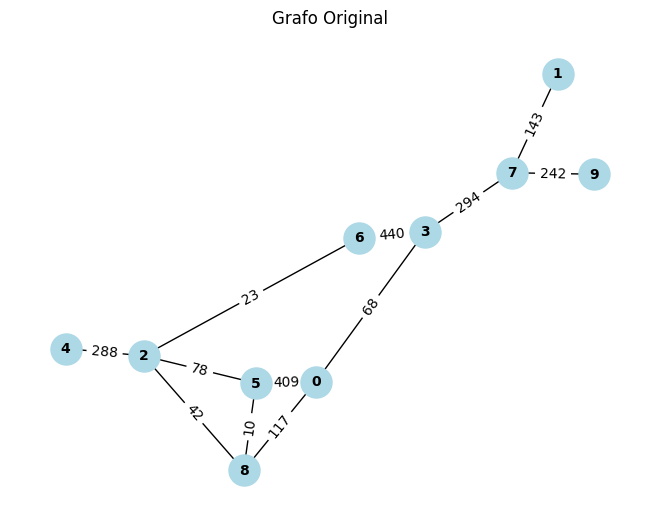

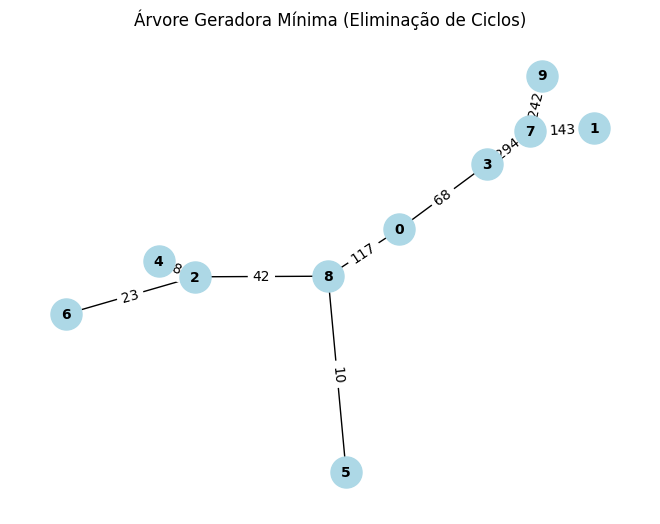

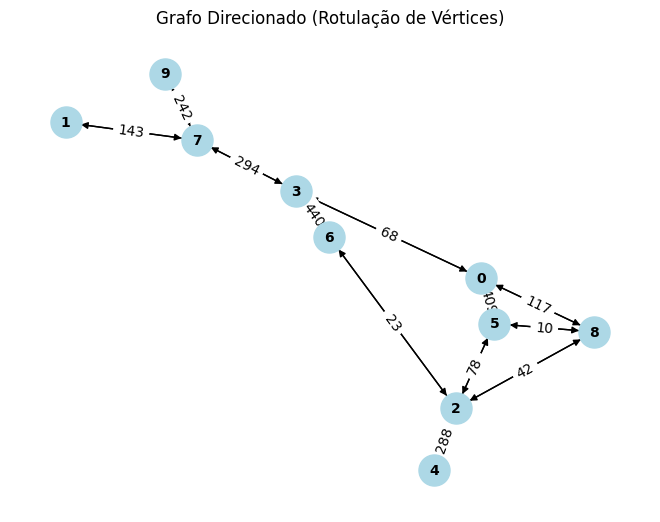

In [34]:
n = 10  
p = 0.3  

G = gerar_grafo_aleatorio(n, p)
desenhar_grafo(G, "Grafo Original")

mst = elimination_of_cycles(G)
desenhar_grafo(mst, "Árvore Geradora Mínima (Eliminação de Ciclos)")

D, labels = vertex_labeling(G)
desenhar_grafo(D, "Grafo Direcionado (Rotulação de Vértices)")

# Instâncias

In [18]:
def ler_arquivo_instancia(caminho_arquivo):
    with open(caminho_arquivo, 'r') as f:
        linha_inicial = f.readline().split()
        n = int(linha_inicial[0]) 
        nc = int(linha_inicial[1]) 
        m = int(linha_inicial[2]) 
    return n, nc, m

pasta_instancias = './Instancias'

arquivos = [f for f in os.listdir(pasta_instancias) if f.endswith('.txt')]

dados_instancias = []

for arquivo in arquivos:
    caminho_arquivo = f"{pasta_instancias}/{arquivo}"
    n, nc, m = ler_arquivo_instancia(caminho_arquivo)
    dados_instancias.append([arquivo, n, nc, m])

df = pd.DataFrame(dados_instancias, columns=["Nome da Instância", "Total de Vértices", "Vértices Centrais", "Total de Arestas"])

print(df)

   Nome da Instância  Total de Vértices  Vértices Centrais  Total de Arestas
0      tb8ch10_0.txt                 26                 10               205
1      tb8ch10_1.txt                 25                 10               195
2      tb8ch13_0.txt                 33                 13               338
3      tb8ch13_1.txt                 31                 13               312
4      tb8ch15_0.txt                 38                 15               450
5      tb8ch15_1.txt                 37                 15               435
6      tb8ch18_0.txt                 45                 18               639
7      tb8ch18_1.txt                 43                 18               603
8      tb8ch20_0.txt                 50                 20               790
9      tb8ch20_1.txt                 48                 20               750
10     tb8ch25_0.txt                 62                 25              1225
11     tb8ch25_1.txt                 59                 25              1150

./Instancias/tb8ch10_0.txt


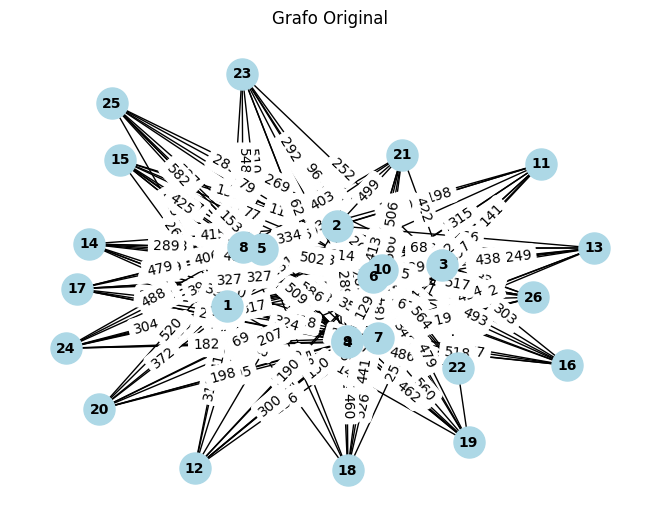

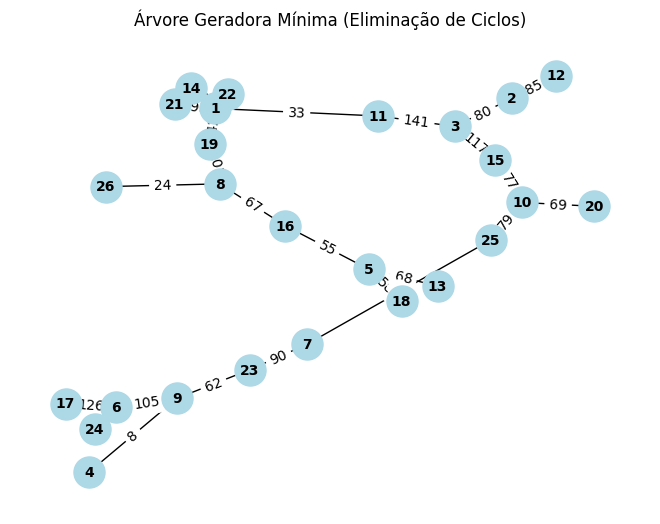

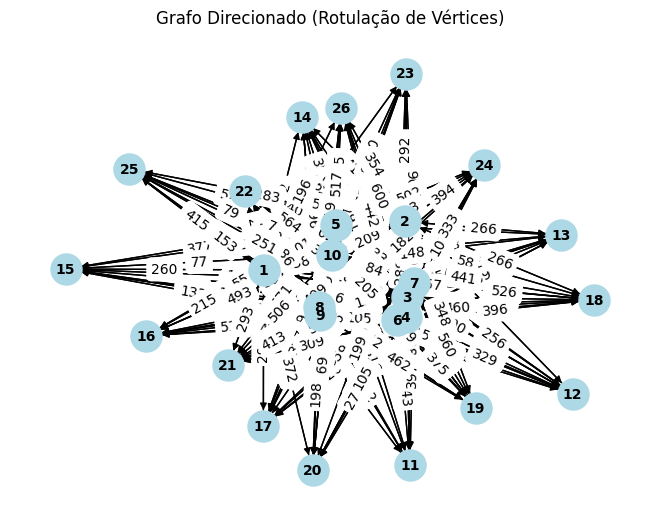

./Instancias/tb8ch10_1.txt


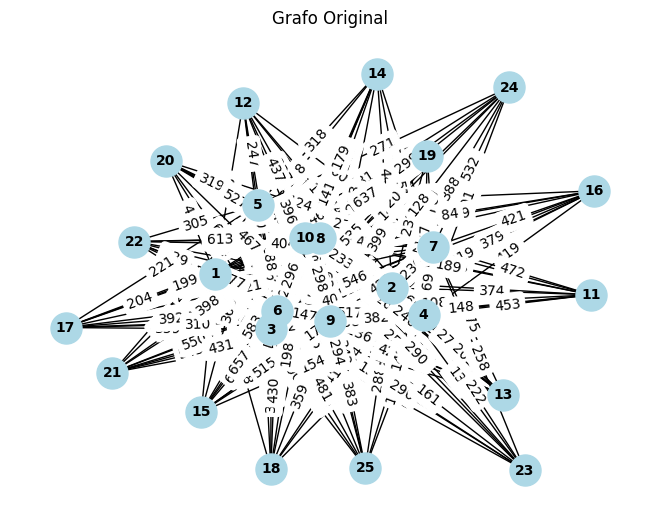

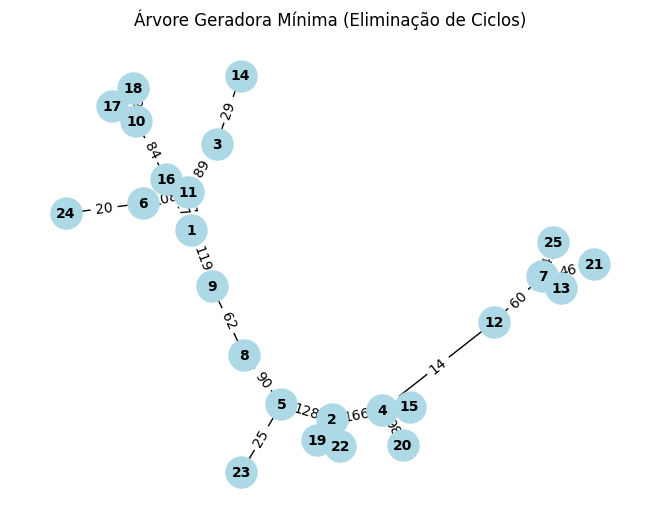

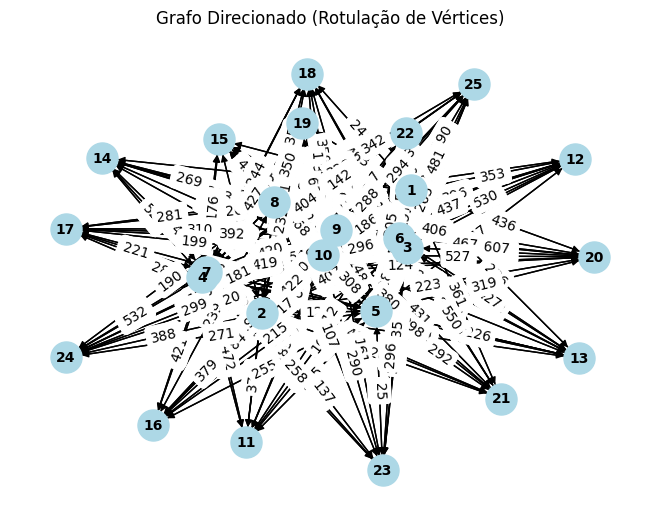

./Instancias/tb8ch13_0.txt


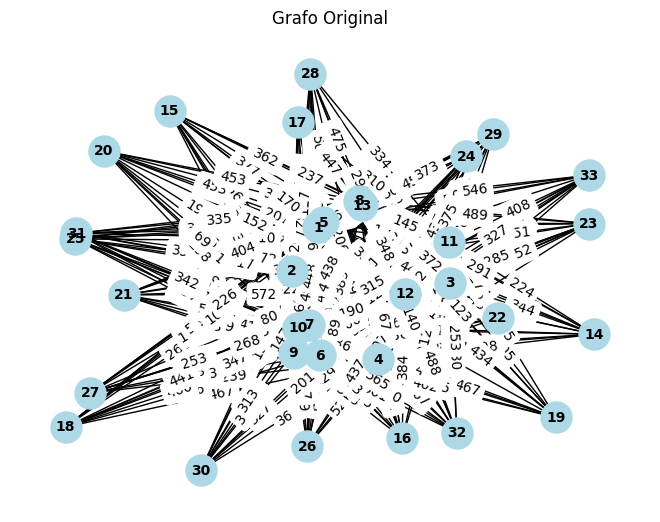

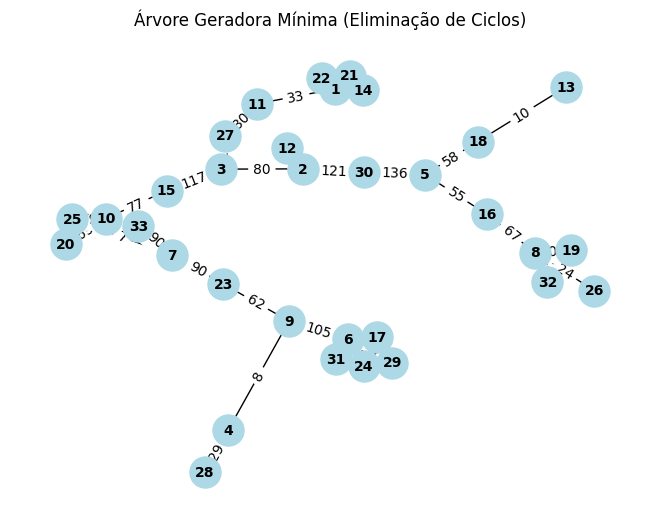

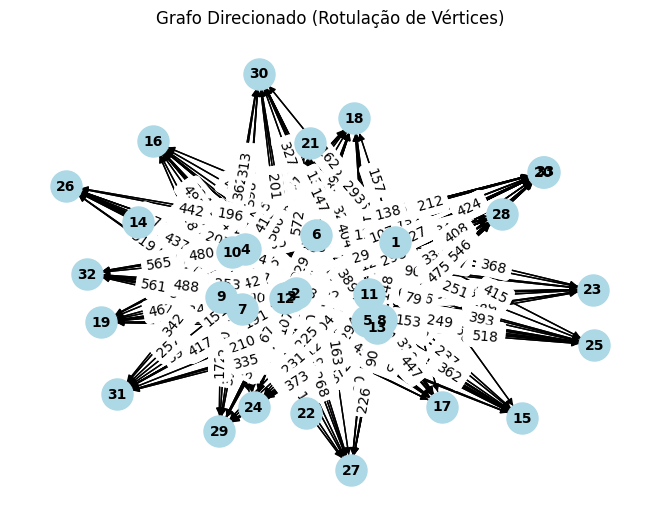

./Instancias/tb8ch13_1.txt


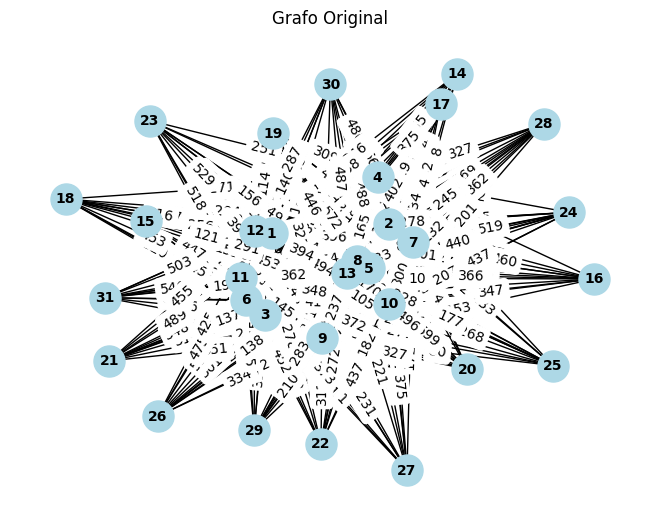

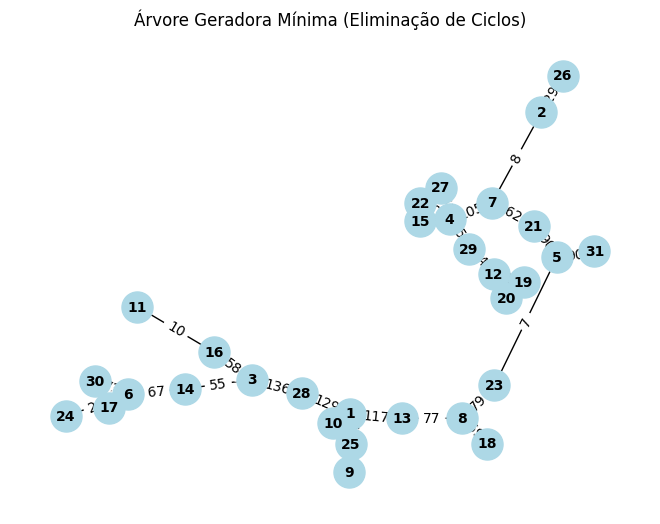

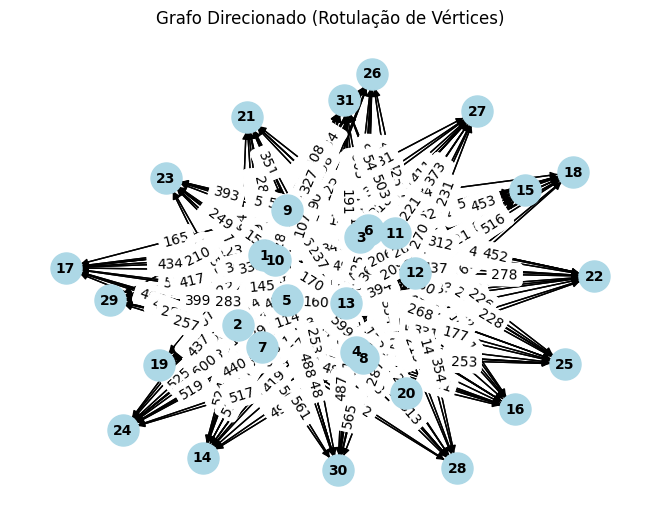

./Instancias/tb8ch15_0.txt


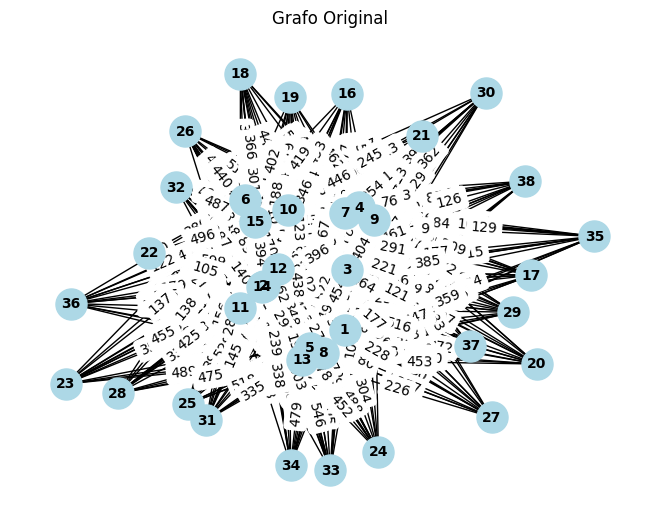

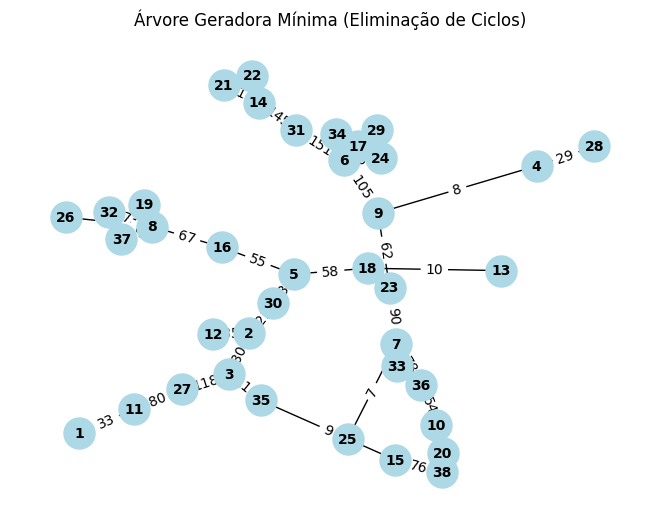

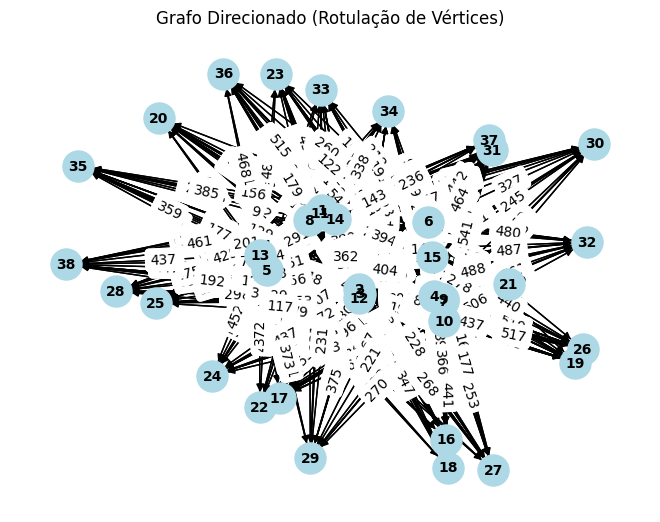

./Instancias/tb8ch15_1.txt


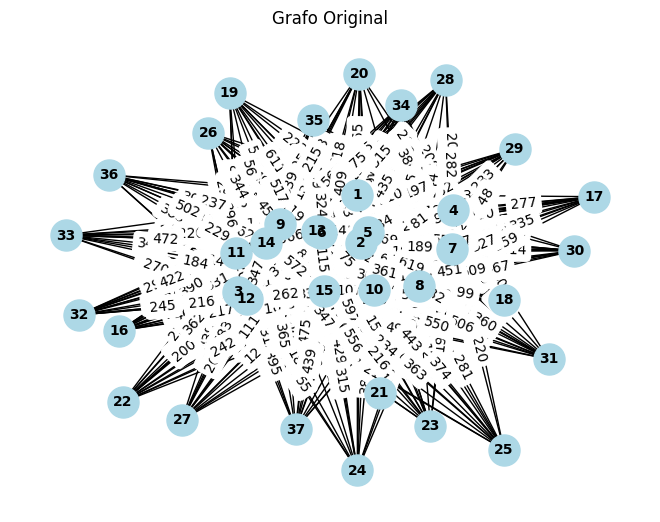

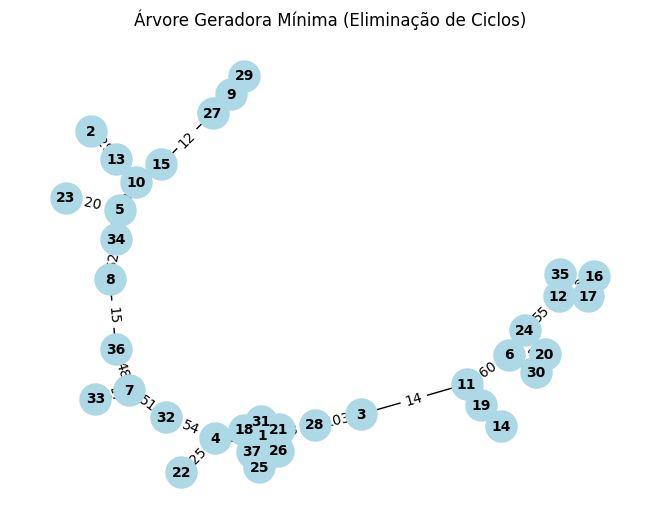

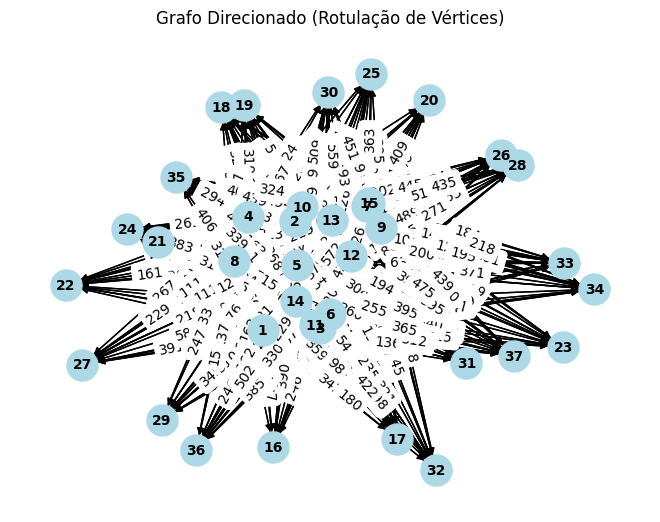

./Instancias/tb8ch18_0.txt


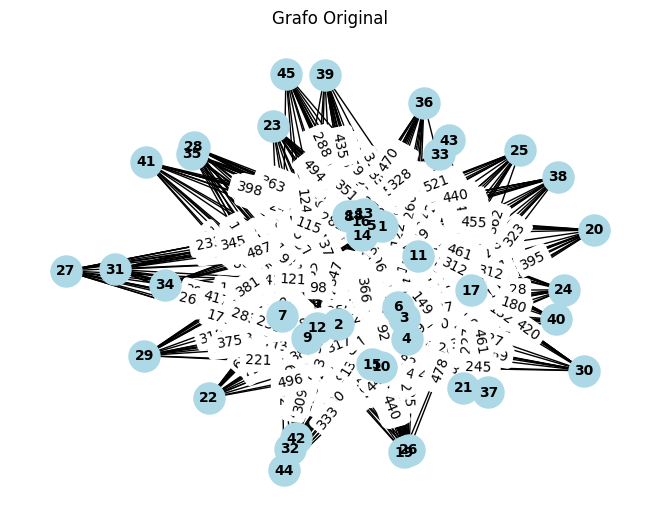

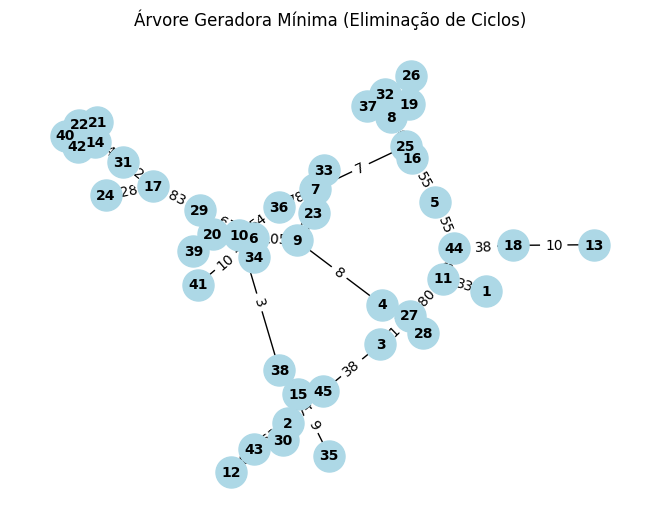

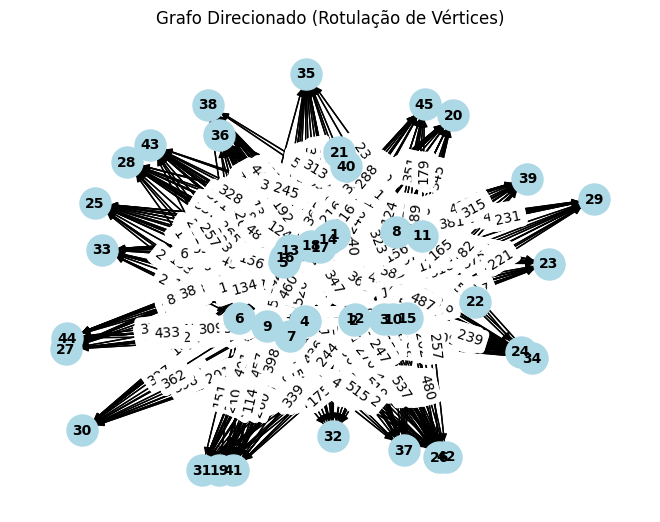

./Instancias/tb8ch18_1.txt


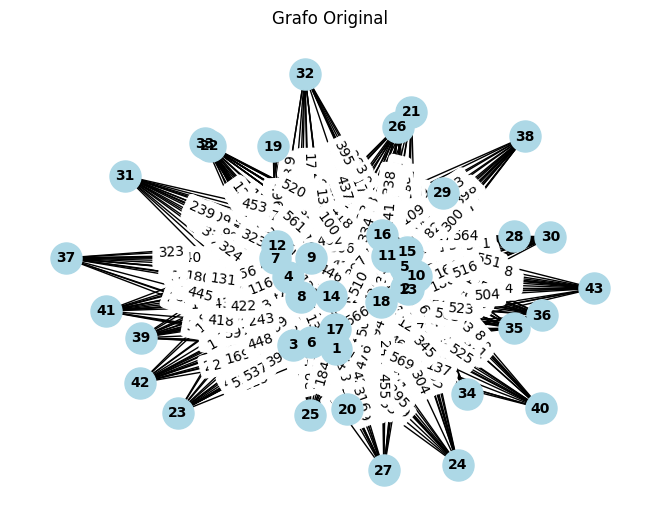

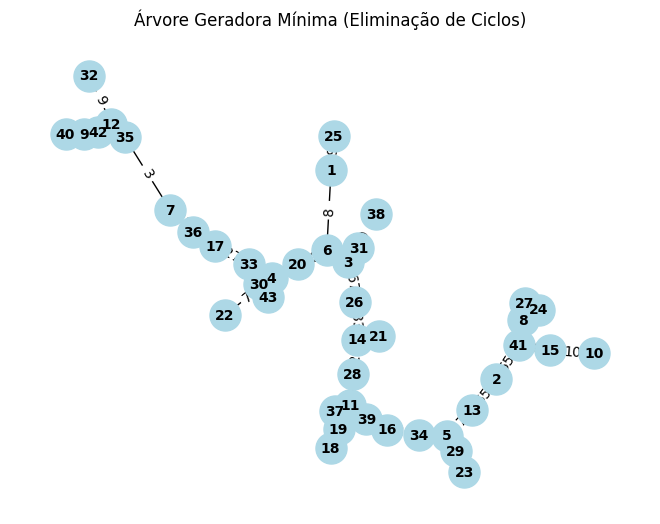

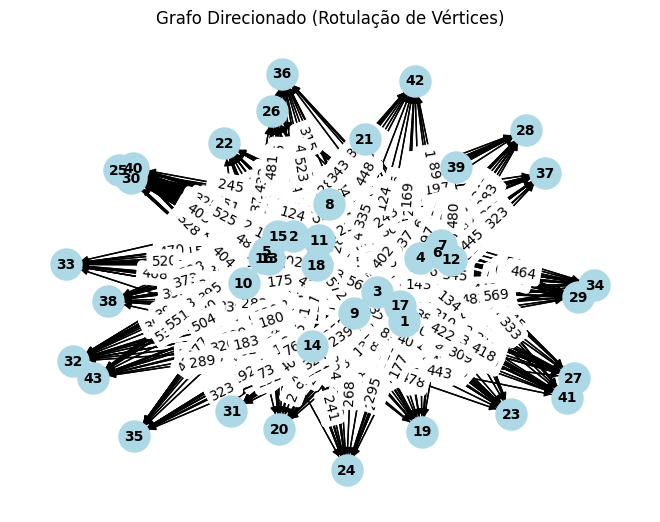

./Instancias/tb8ch20_0.txt


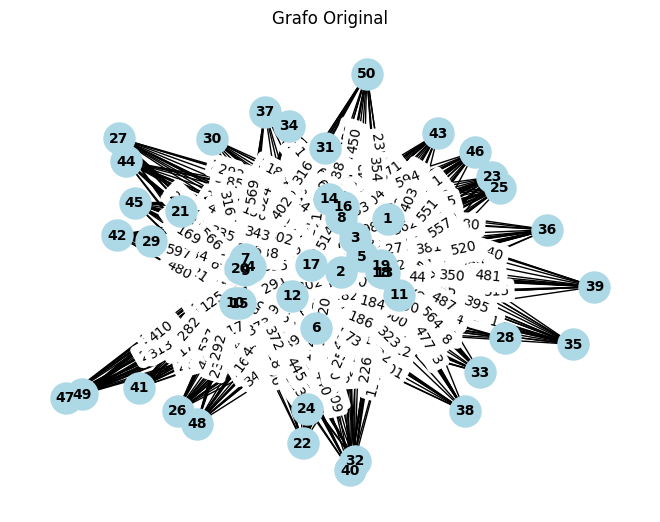

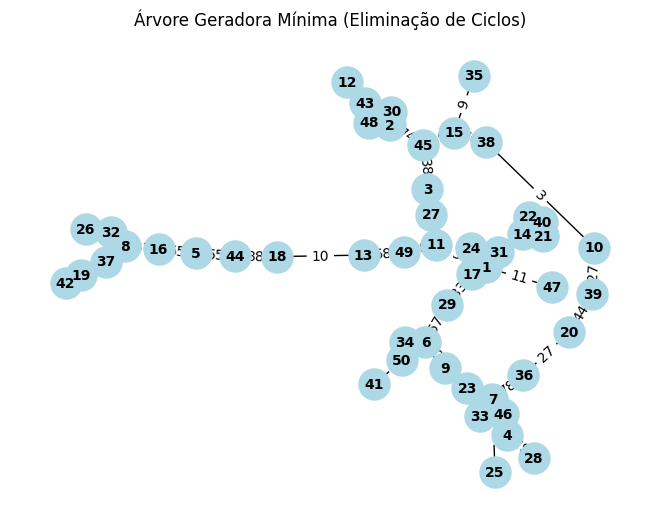

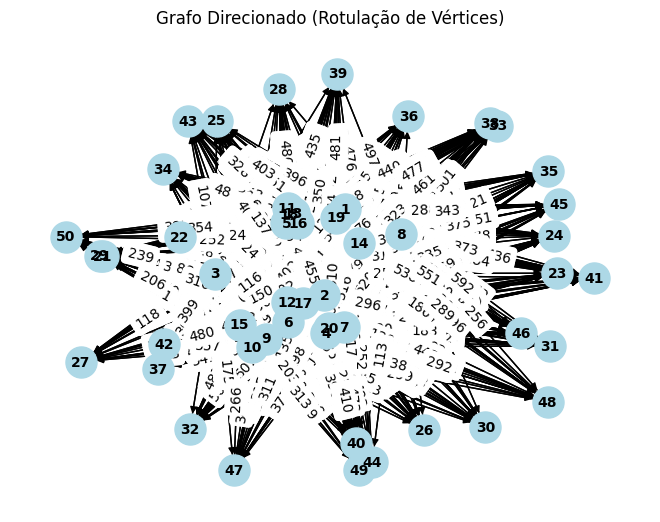

./Instancias/tb8ch20_1.txt


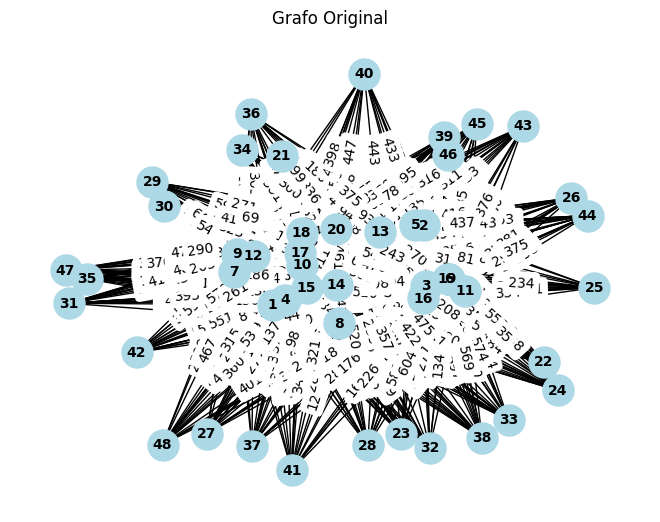

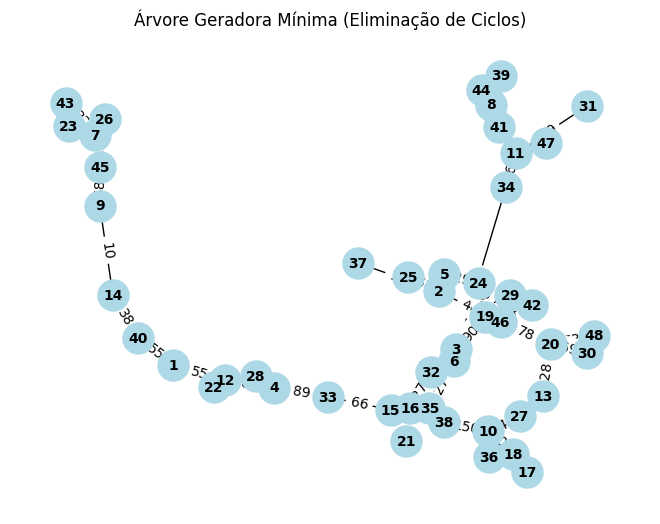

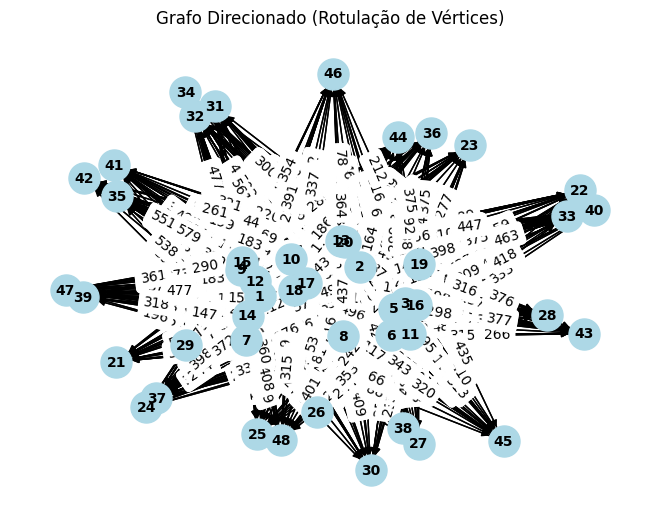

./Instancias/tb8ch25_0.txt


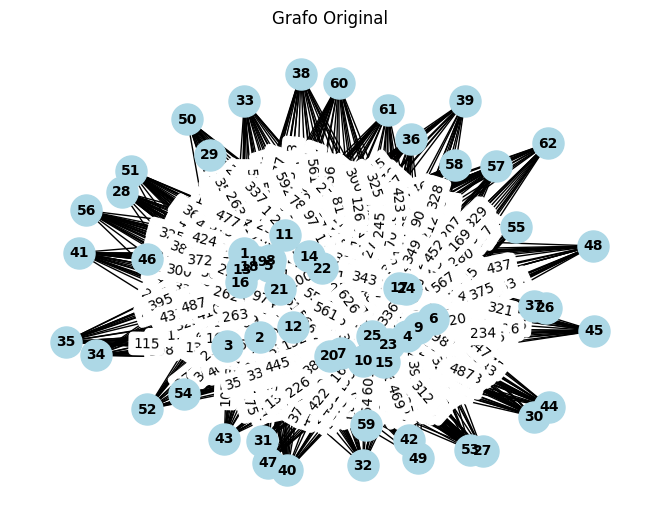

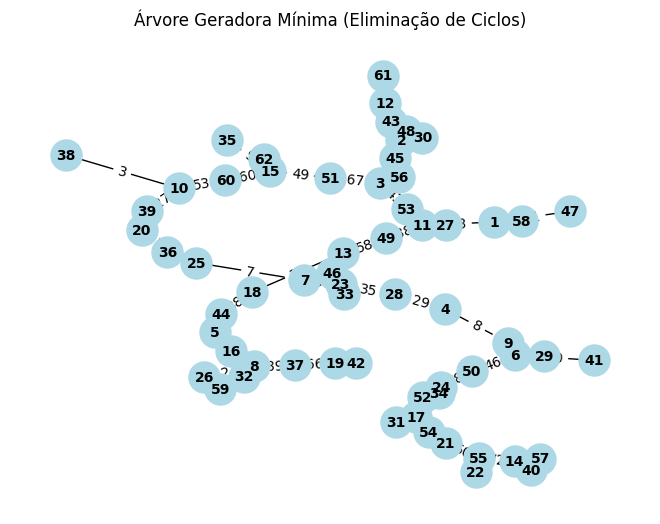

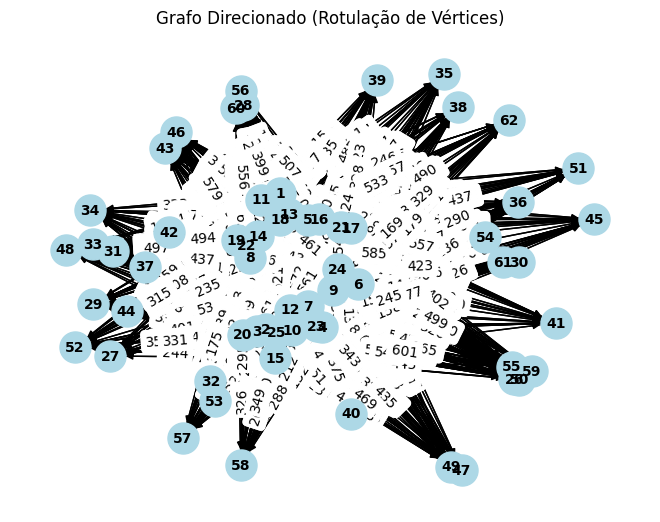

./Instancias/tb8ch25_1.txt


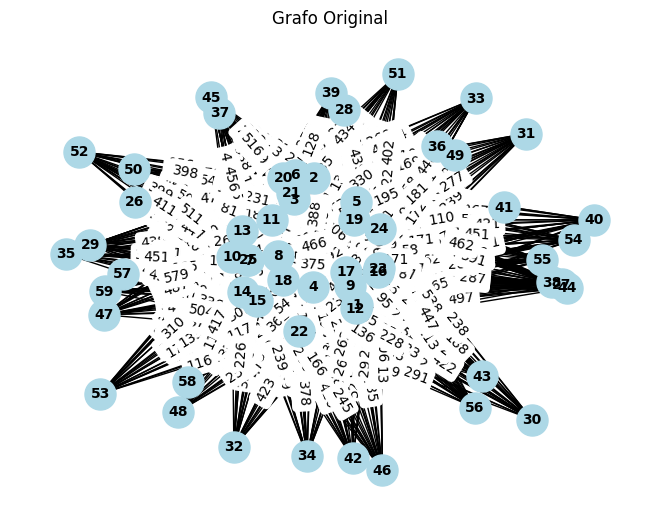

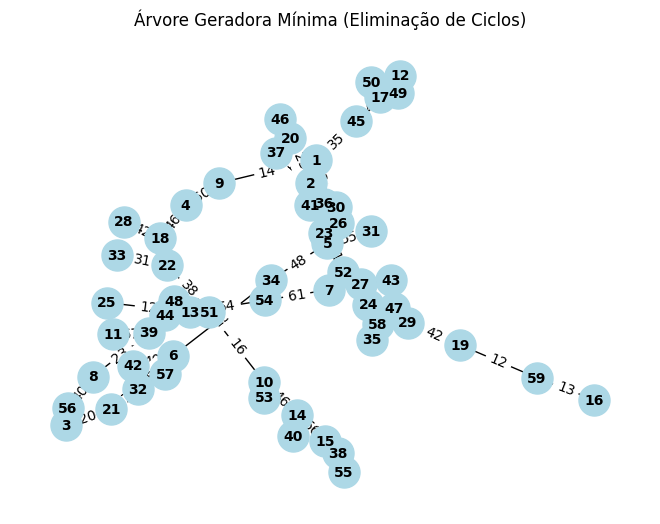

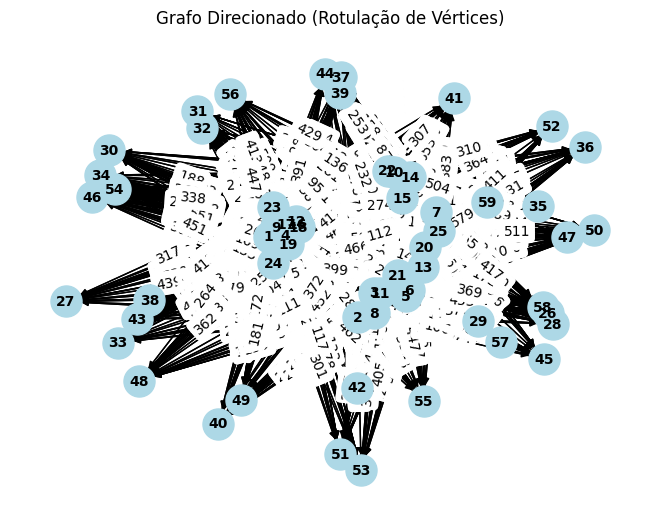

./Instancias/tb8ch30_0.txt


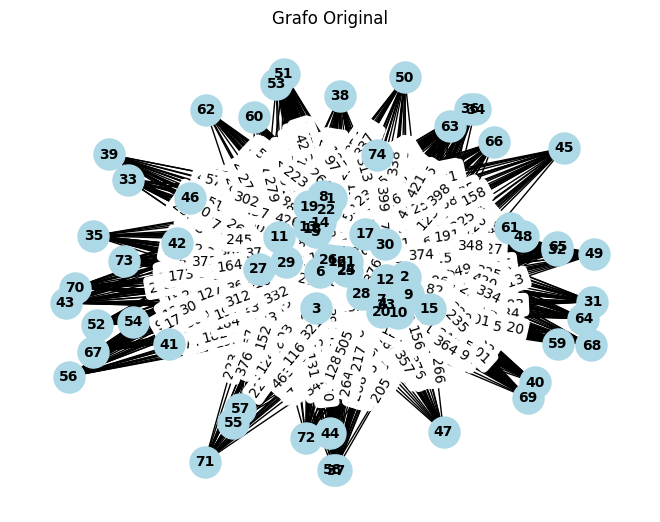

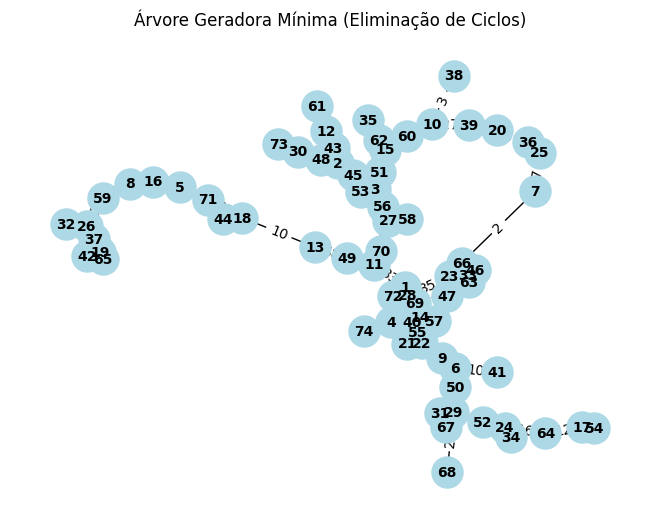

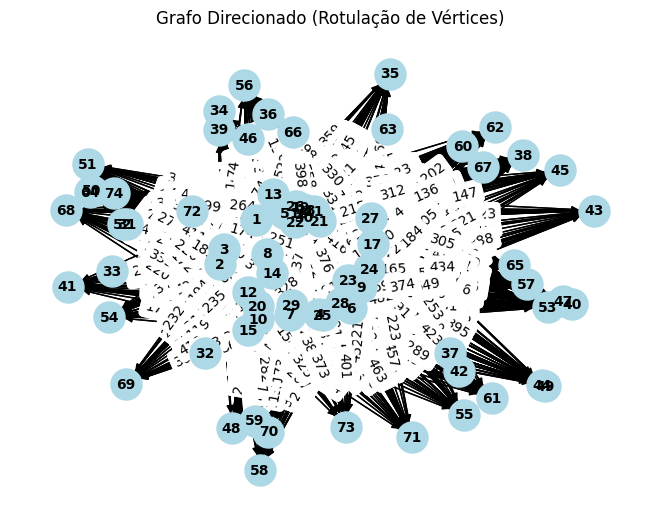

./Instancias/tb8ch30_1.txt


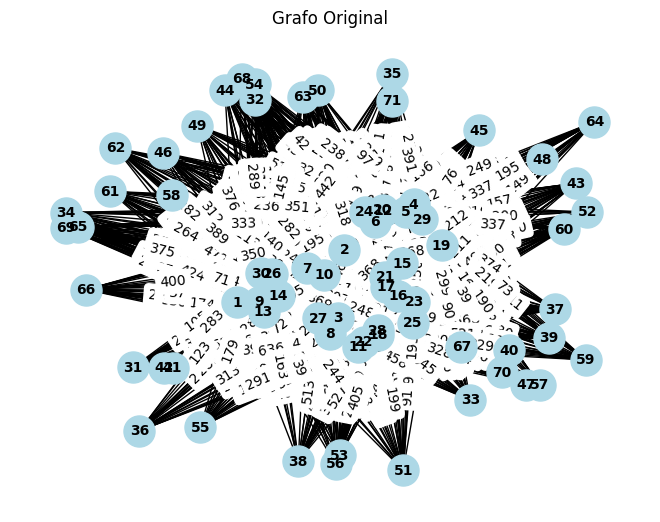

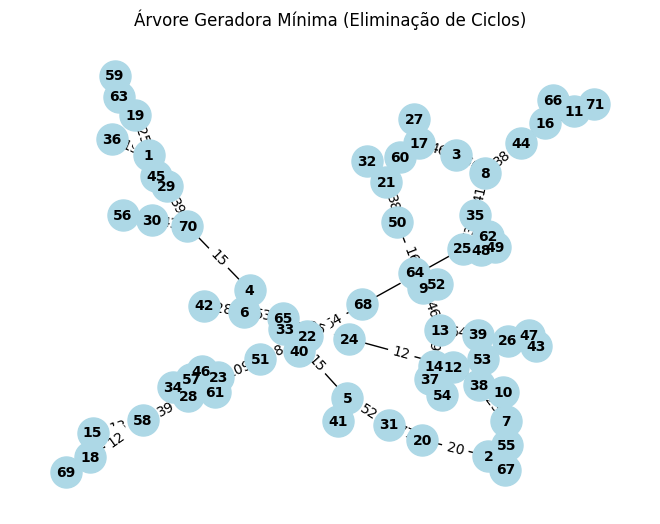

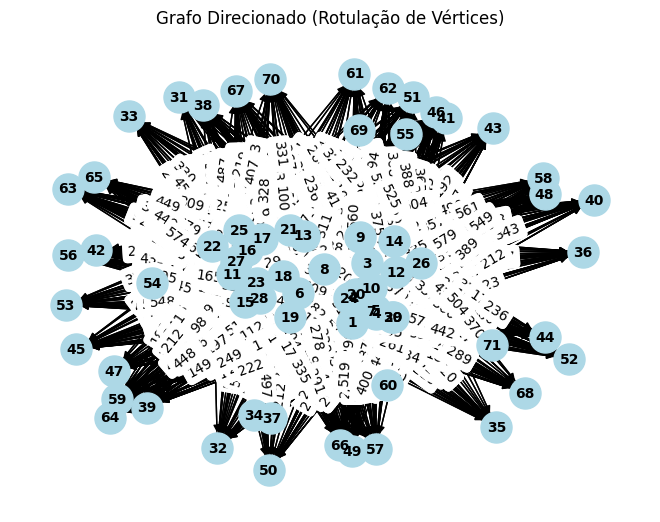

./Instancias/tb8ch35_0.txt


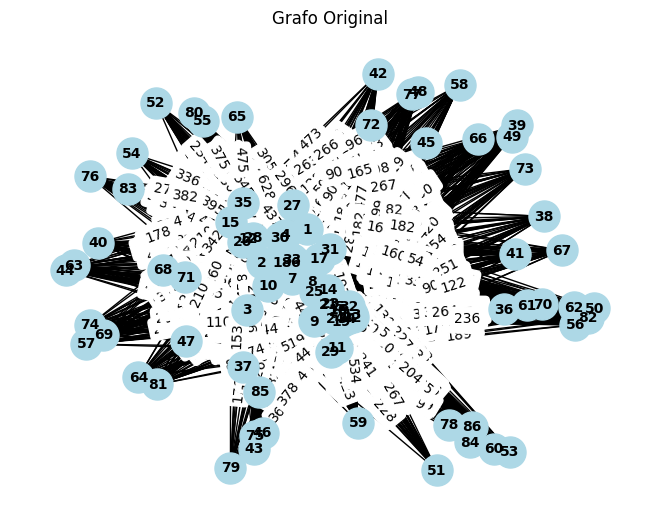

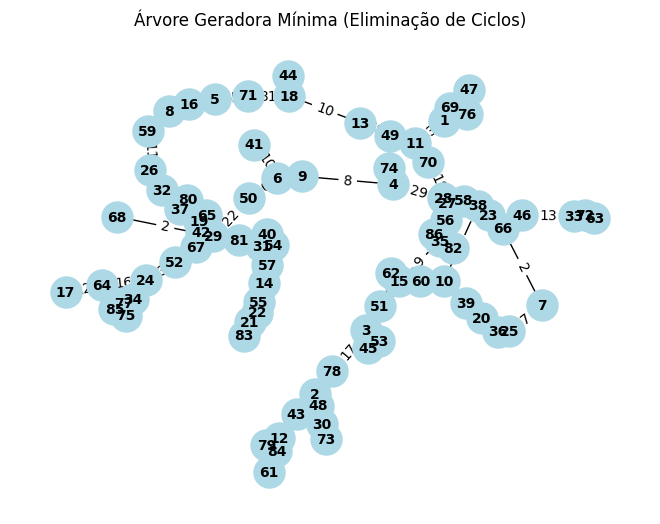

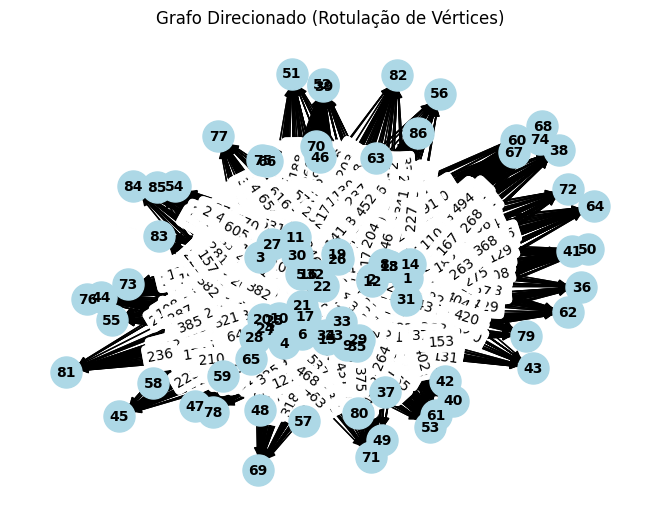

./Instancias/tb8ch35_1.txt


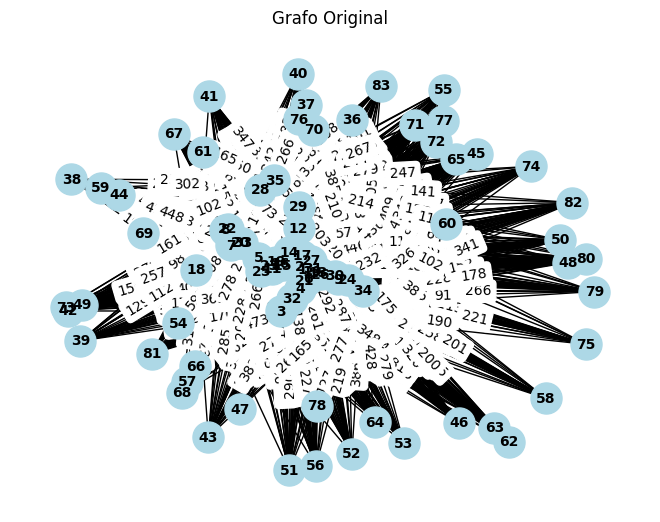

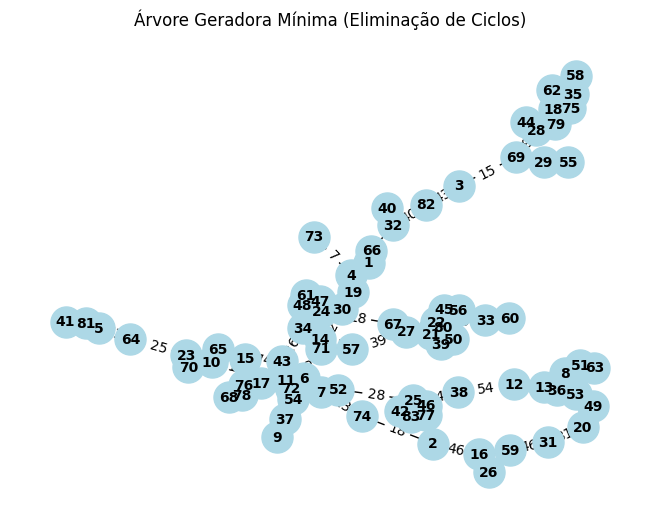

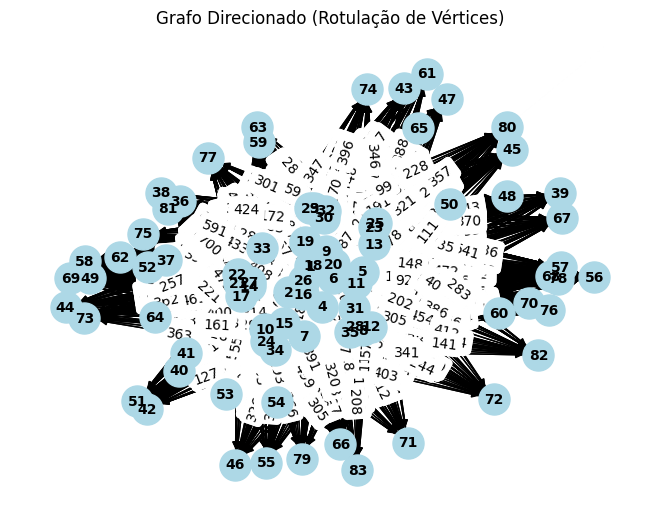

./Instancias/tb8ch4_0.txt


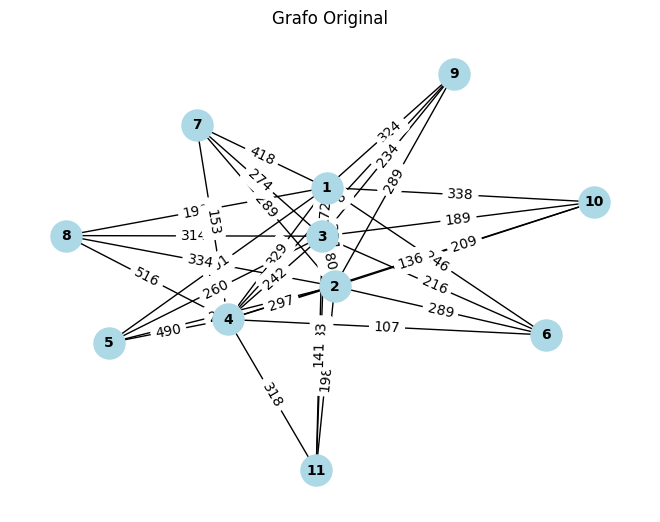

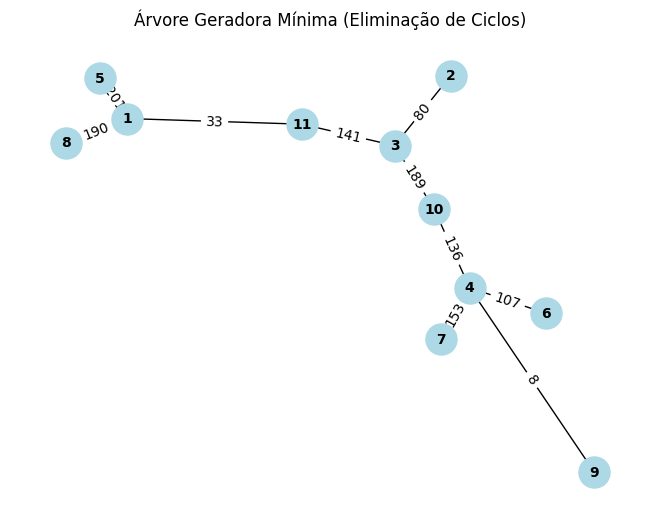

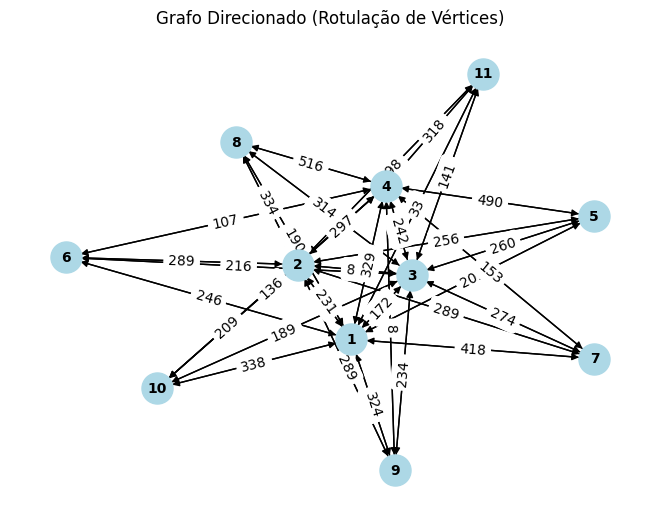

./Instancias/tb8ch4_1.txt


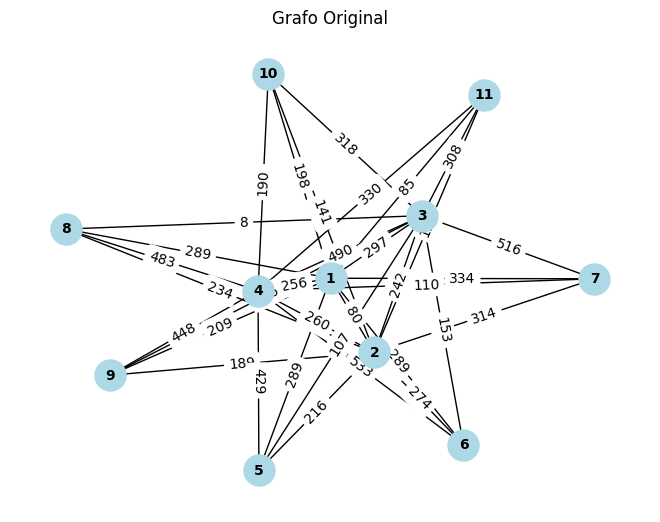

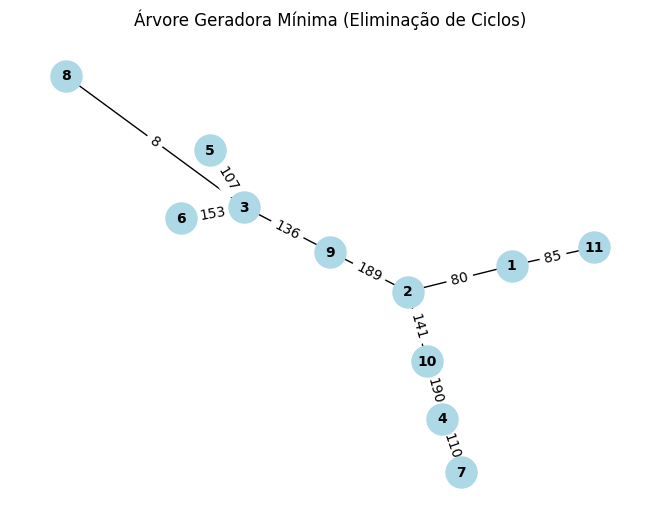

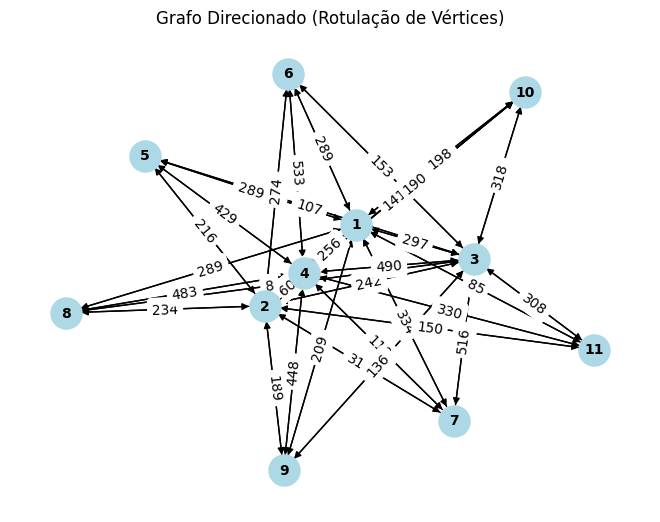

./Instancias/tb8ch6_0.txt


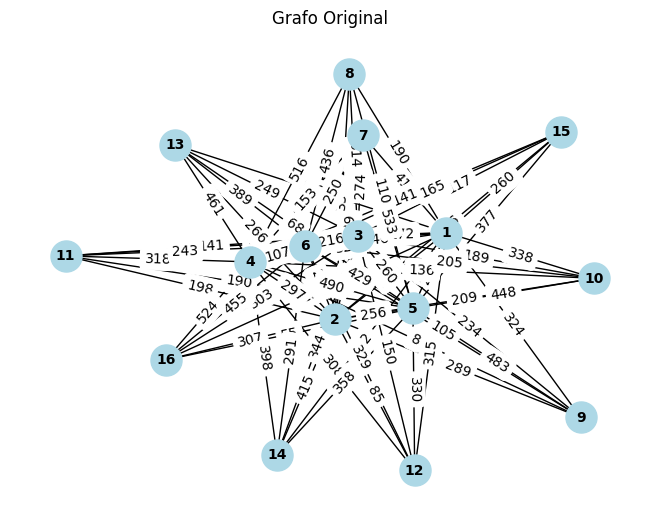

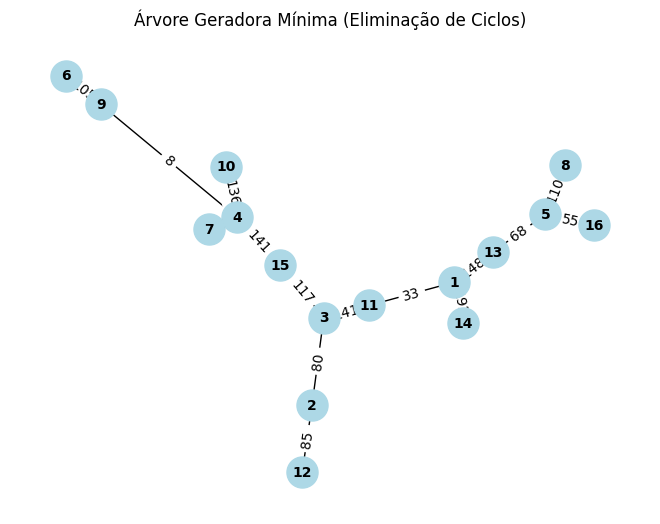

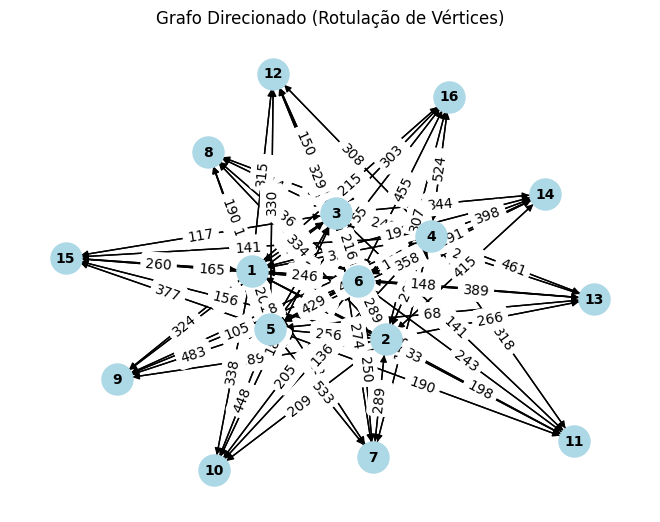

./Instancias/tb8ch6_1.txt


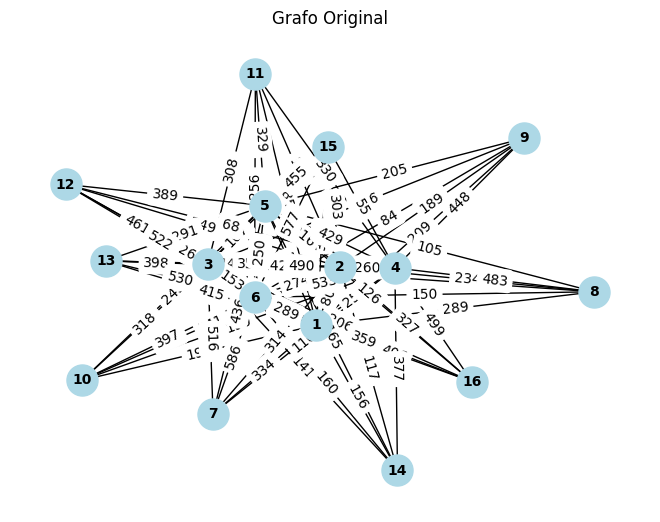

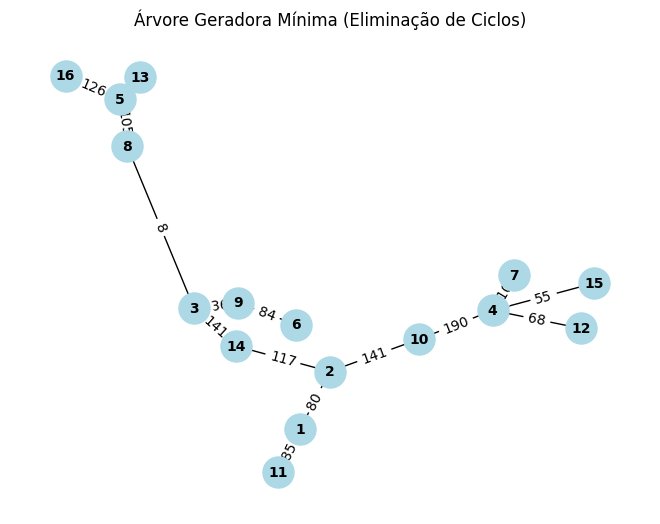

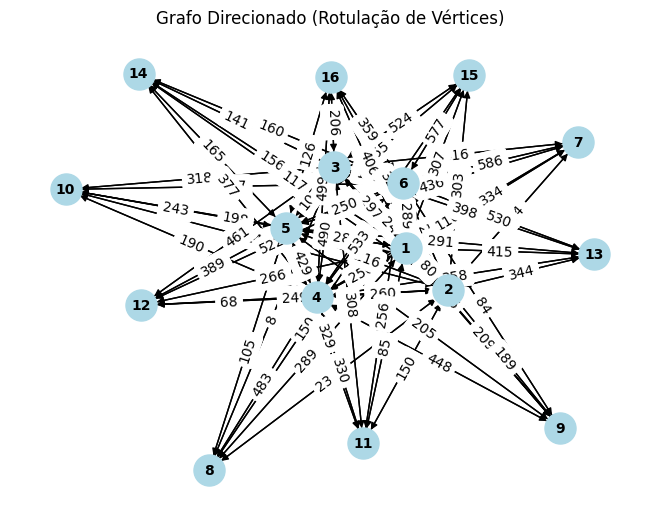

./Instancias/tb8ch8_0.txt


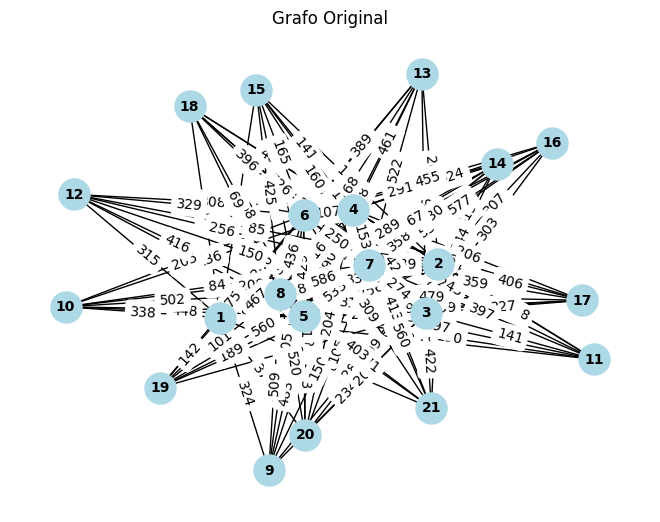

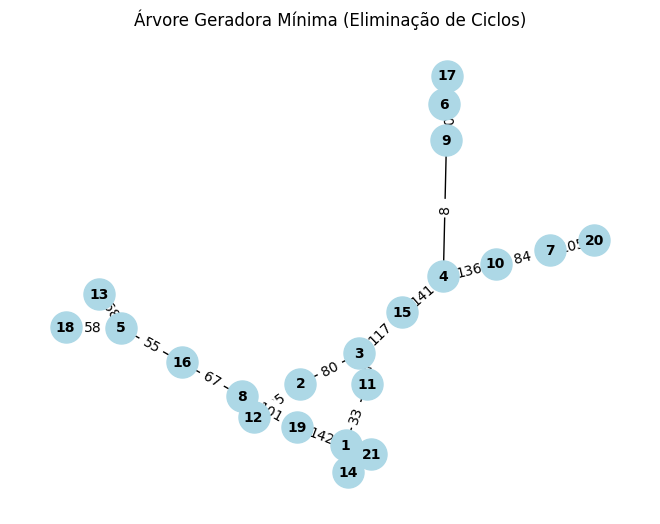

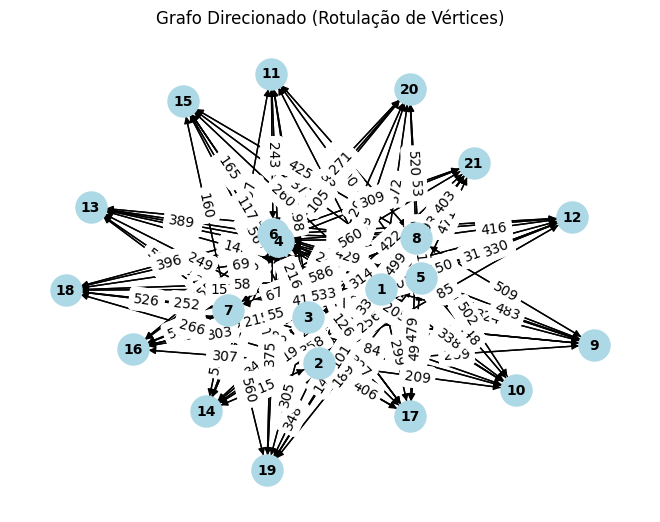

./Instancias/tb8ch8_1.txt


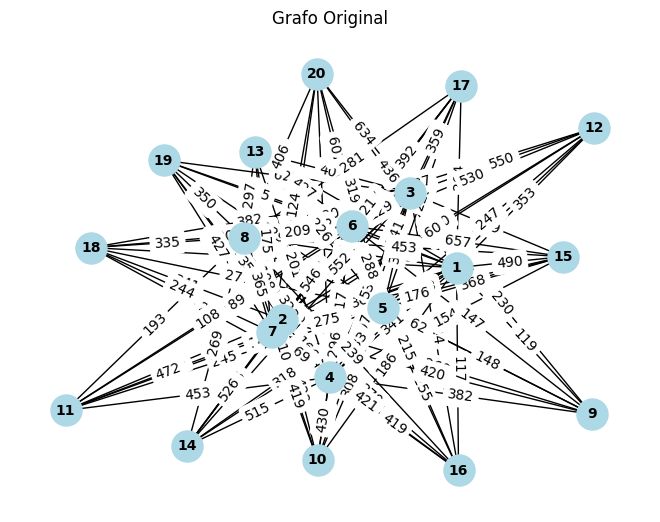

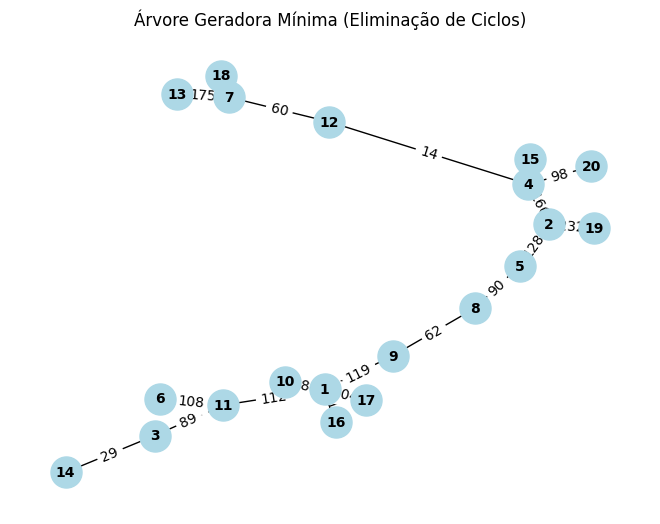

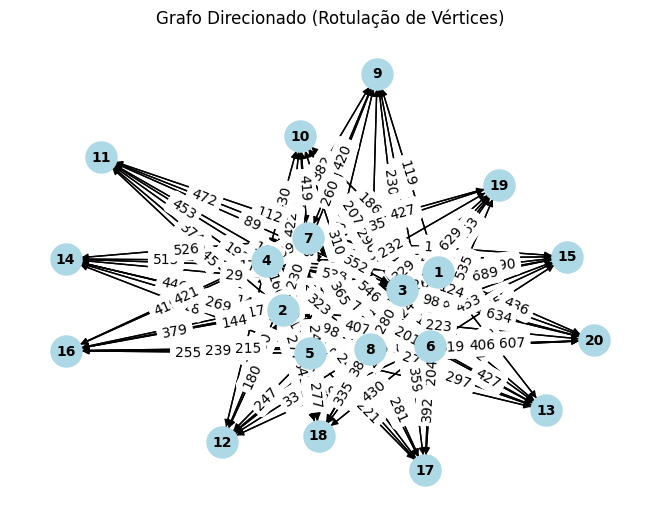

In [19]:
pasta_instancias = './Instancias'

arquivos = [f for f in os.listdir(pasta_instancias) if f.endswith('.txt')]

for arquivo in arquivos:
    caminho_arquivo = f"{pasta_instancias}/{arquivo}"
    print(caminho_arquivo)
    G, vertices_centrais, graus_centrais = ler_arquivo_e_gerar_grafo(caminho_arquivo)

    desenhar_grafo(G, "Grafo Original")

    mst = elimination_of_cycles(G)
    desenhar_grafo(mst, "Árvore Geradora Mínima (Eliminação de Ciclos)")

    D, labels = vertex_labeling(G)
    desenhar_grafo(D, "Grafo Direcionado (Rotulação de Vértices)")
    

In [20]:
def calcular_custo(G):
    """Calcula o custo total das arestas do grafo."""
    return sum(data['weight'] for u, v, data in G.edges(data=True))

def medir_tempo(formulacao, G):
    """Mede o tempo de execução de uma formulação e retorna o resultado e o tempo."""
    inicio = time.time()
    if formulacao == vertex_labeling:
        resultado, labels = formulacao(G)
    else:
        resultado = formulacao(G)
        labels = None
    fim = time.time()
    return resultado, labels, fim - inicio

def comparar_algoritmos(caminho_instancias):
    """Compara os algoritmos de eliminação de ciclos e rotulação de vértices e retorna um DataFrame com os resultados."""
    arquivos = [f for f in os.listdir(caminho_instancias) if f.endswith('.txt')]
    
    resultados = []

    for arquivo in arquivos:
        caminho_arquivo = f"{caminho_instancias}/{arquivo}"
        G, vertices_centrais, graus_centrais = ler_arquivo_e_gerar_grafo(caminho_arquivo)
        
        mst, _, tempo_eliminacao = medir_tempo(elimination_of_cycles, G)
        custo_eliminacao = calcular_custo(mst)
        
        D, labels, tempo_rotulos = medir_tempo(vertex_labeling, G)  
        custo_rotulacao = calcular_custo(D) 
        
        resultados.append([
            arquivo,
            f"{custo_eliminacao:,.2f}", 
            f"{tempo_eliminacao:.2f}",  
            f"{custo_rotulacao:,.2f}",    
            f"{tempo_rotulos:.2f}"       
        ])

    df_resultados = pd.DataFrame(resultados, columns=["Nome da Instância", "Custo Eliminação de Ciclos", "Tempo Eliminação de Ciclos (s)", "Custo Rotulação de Vértices", "Tempo Rotulação de Vértices (s)"])
    
    return df_resultados

pasta_instancias = './Instancias'

df_resultados = comparar_algoritmos(pasta_instancias)

pd.set_option('display.max_rows', None)

print(tabulate(df_resultados, headers='keys', tablefmt='fancy_grid'))


╒════╤═════════════════════╤══════════════════════════════╤══════════════════════════════════╤═══════════════════════════════╤═══════════════════════════════════╕
│    │ Nome da Instância   │ Custo Eliminação de Ciclos   │   Tempo Eliminação de Ciclos (s) │ Custo Rotulação de Vértices   │   Tempo Rotulação de Vértices (s) │
╞════╪═════════════════════╪══════════════════════════════╪══════════════════════════════════╪═══════════════════════════════╪═══════════════════════════════════╡
│  0 │ tb8ch10_0.txt       │ 2,480.00                     │                                0 │ 126,088.00                    │                              0    │
├────┼─────────────────────┼──────────────────────────────┼──────────────────────────────────┼───────────────────────────────┼───────────────────────────────────┤
│  1 │ tb8ch10_1.txt       │ 2,674.00                     │                                0 │ 119,680.00                    │                              0    │
├────┼────────────────